In [6]:
!pip install opencv-python

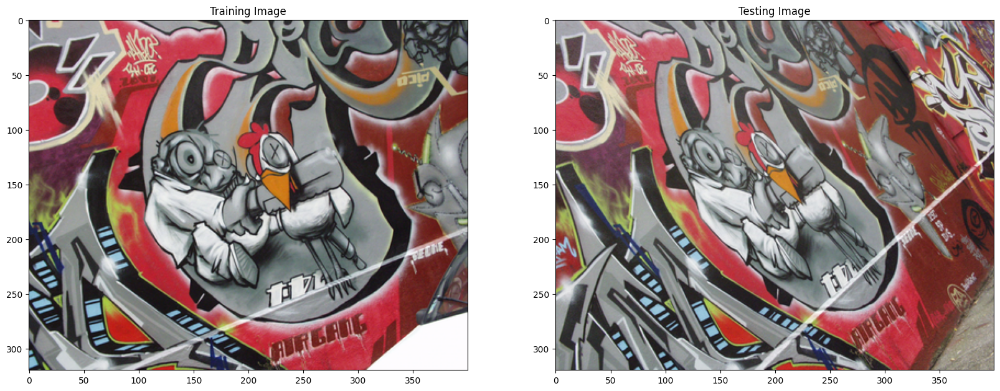

In [7]:
from ast import increment_lineno
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

image1 = cv2.imread('C:/Users/pacha/OneDrive/Desktop/CV assignments/img2.png')
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

image2 = cv2.imread('C:/Users/pacha/OneDrive/Desktop/CV assignments/img4.png')
testing_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
testing_gray = cv2.cvtColor(testing_image, cv2.COLOR_RGB2GRAY)

fx, plots = plt.subplots(1,2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(testing_image)

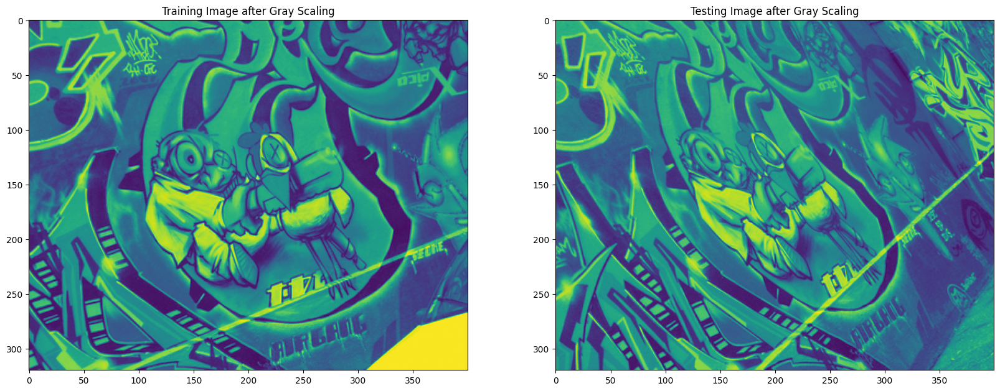

In [8]:
fx, plots = plt.subplots(1,2, figsize=(20,10))
plots[0].set_title("Training Image after Gray Scaling")
plots[0].imshow(training_gray)

plots[1].set_title("Testing Image after Gray Scaling")
plots[1].imshow(testing_gray)

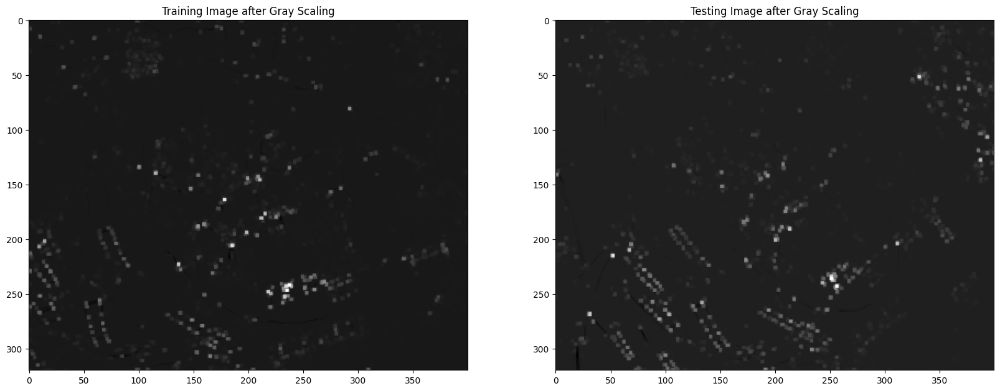

In [9]:
dst1 = cv2.cornerHarris(training_gray, 2, 3, 0.04)
dst1 = cv2.dilate(dst1, None)

dst2 = cv2.cornerHarris(testing_gray, 2, 3, 0.04)  # Corrected the typo here
dst2 = cv2.dilate(dst2, None)  # Corrected 'dilate' spelling

fx, plots = plt.subplots(1, 2, figsize=(20, 10))
plots[0].set_title("Training Image after Gray Scaling")
plots[0].imshow(dst1, cmap='gray')  # Added 'cmap' to properly display grayscale

plots[1].set_title("Testing Image after Gray Scaling")
plots[1].imshow(dst2, cmap='gray')  # Added 'cmap' to properly display grayscale

plt.show()  # To display the images

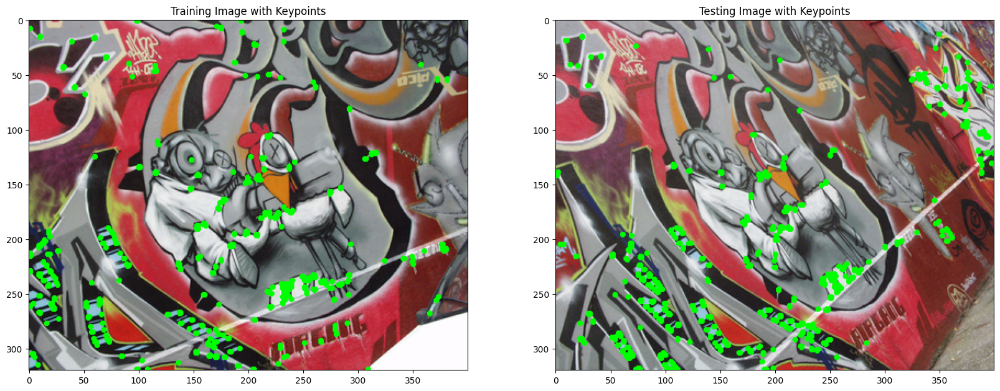

Number of keypoints detected in the training image: 2858
Number of keypoints detected in the testing image: 3375


In [10]:
thresh1 = 0.1 * dst1.max()
thresh2 = 0.1 * dst2.max()

training_image_copy = np.copy(training_image)
testing_image_copy = np.copy(testing_image)

corner_image1 = np.copy(training_image_copy)
corner_image2 = np.copy(testing_image_copy)

keypoints1 = 0  # Counter for keypoints in training image
keypoints2 = 0  # Counter for keypoints in testing image

# Loop for detecting keypoints in the training image
for j in range(0, dst1.shape[0]):
    for i in range(0, dst1.shape[1]):
        if dst1[j, i] > thresh1:
            keypoints1 += 1  # Increment counter for training image
            cv2.circle(corner_image1, (i, j), 1, (0, 255, 0), 1)

# Loop for detecting keypoints in the testing image
for j in range(0, dst2.shape[0]):
    for i in range(0, dst2.shape[1]):
        if dst2[j, i] > thresh2:
            keypoints2 += 1  # Increment counter for testing image
            cv2.circle(corner_image2, (i, j), 1, (0, 255, 0), 1)

# Plotting the images
fx, plots = plt.subplots(1, 2, figsize=(20, 10))
plots[0].set_title("Training Image with Keypoints")
plots[0].imshow(corner_image1)

plots[1].set_title("Testing Image with Keypoints")
plots[1].imshow(corner_image2)

plt.show()

# Print the number of keypoints detected
print(f"Number of keypoints detected in the training image: {keypoints1}")
print(f"Number of keypoints detected in the testing image: {keypoints2}")

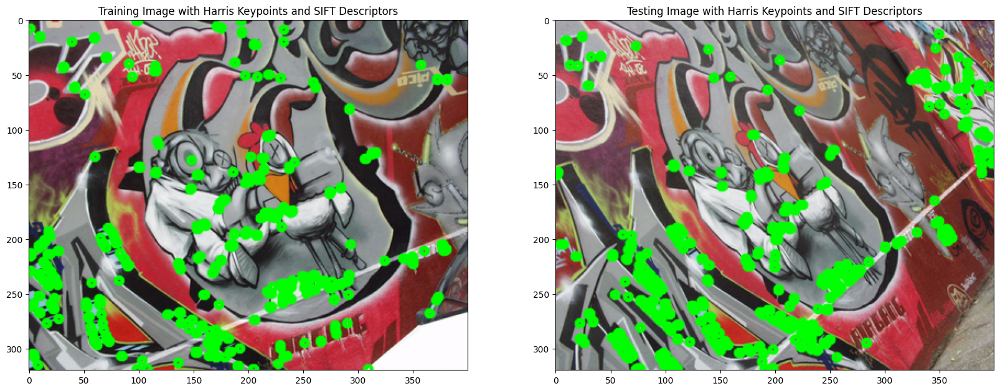

Number of Harris keypoints in training image: 2858, Descriptor shape: (2858, 128)
Number of Harris keypoints in testing image: 3375, Descriptor shape: (3375, 128)


In [11]:
# Step 1: Initialize SIFT detector
sift = cv2.SIFT_create()

# Function to convert Harris corners to OpenCV KeyPoint format
def convert_to_keypoints(corner_image, dst, threshold):
    keypoints = []
    for j in range(0, dst.shape[0]):
        for i in range(0, dst.shape[1]):
            if dst[j, i] > threshold:
                # Create a KeyPoint object for each corner
                keypoints.append(cv2.KeyPoint(i, j, 1))  # (i, j) are coordinates, 1 is the size of the keypoint
    return keypoints

# Step 2: Convert Harris keypoints to SIFT keypoints
harris_keypoints1 = convert_to_keypoints(training_image, dst1, thresh1)
harris_keypoints2 = convert_to_keypoints(testing_image, dst2, thresh2)

# Step 3: Compute SIFT descriptors using Harris keypoints
_, descriptors1 = sift.compute(training_gray, harris_keypoints1)
_, descriptors2 = sift.compute(testing_gray, harris_keypoints2)

# Step 4: Draw keypoints (from Harris corner detection) on the original images
sift_training_image = cv2.drawKeypoints(training_image, harris_keypoints1, None, color=(0, 255, 0))
sift_testing_image = cv2.drawKeypoints(testing_image, harris_keypoints2, None, color=(0, 255, 0))

# Step 5: Plot the images with keypoints
fx, plots = plt.subplots(1, 2, figsize=(20, 10))
plots[0].set_title("Training Image with Harris Keypoints and SIFT Descriptors")
plots[0].imshow(sift_training_image)

plots[1].set_title("Testing Image with Harris Keypoints and SIFT Descriptors")
plots[1].imshow(sift_testing_image)

plt.show()

# Step 6: Print descriptor shapes
print(f"Number of Harris keypoints in training image: {len(harris_keypoints1)}, Descriptor shape: {descriptors1.shape}")
print(f"Number of Harris keypoints in testing image: {len(harris_keypoints2)}, Descriptor shape: {descriptors2.shape}")


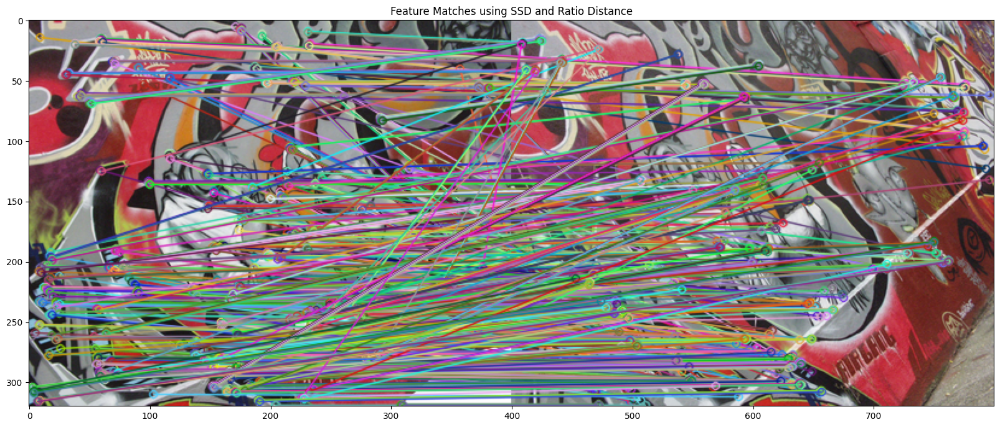

Number of good matches found: 626


In [12]:
# Function to calculate SSD distance between two descriptors
def calculate_ssd(descriptor1, descriptor2):
    return np.sum((descriptor1 - descriptor2) ** 2)

# Function to find matches using SSD and ratio distance
def match_features(descriptors1, descriptors2, ratio_threshold=0.75):
    matches = []
    for i, descriptor1 in enumerate(descriptors1):
        # Calculate SSD between this descriptor and all descriptors from the second image
        ssd_distances = []
        for j, descriptor2 in enumerate(descriptors2):
            ssd_distances.append((j, calculate_ssd(descriptor1, descriptor2)))

        # Sort SSD distances to find the closest and second closest matches
        ssd_distances = sorted(ssd_distances, key=lambda x: x[1])

        # Get the best (closest) and second-best matches
        best_match_idx = ssd_distances[0][0]
        second_best_match_idx = ssd_distances[1][0]

        # Compute the ratio distance
        ratio = ssd_distances[0][1] / ssd_distances[1][1]

        # Apply the ratio test to keep good matches
        if ratio < ratio_threshold:
            matches.append((i, best_match_idx, ratio))

    return matches

# Step 7: Perform feature matching with SSD and ratio distance
matches = match_features(descriptors1, descriptors2)

# Step 8: Visualize the matches
# Convert the keypoints to a format for OpenCV drawing
good_matches = [cv2.DMatch(_queryIdx=match[0], _trainIdx=match[1], _distance=match[2]) for match in matches]

# Draw matches between the two images
matched_image = cv2.drawMatches(training_image, harris_keypoints1, testing_image, harris_keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Plot the image with the matches
plt.figure(figsize=(20, 10))
plt.imshow(matched_image)
plt.title("Feature Matches using SSD and Ratio Distance")
plt.show()

# Step 9: Print number of good matches
print(f"Number of good matches found: {len(good_matches)}")
